## Figure notebook for annotating single-nuclei RNA-seq datasets (from neurips 2021, S1D1 multiome)

Last updated: 1/4/2023
Author: Yang-Joon Kim

Notse: 
- We will use the neurips 2021, s1d1 (RNA+ATAC) objects, only for the RNA part.
- We will use a subset of cell-types for UMAP visualizations for simplicity
- We will generate the whole figure using matplotlib (following Jonathan's Jupyter notebooks).


In [30]:
import os
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
import anndata as ad
import scanpy as sc
import seaborn as sns
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.lines import Line2D
#from skimage.measure import block_reduce
import tifffile
import string
from sklearn.metrics import confusion_matrix

mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  # Colors in this style

# Plotting style function (run this before plotting the final figure)
def set_plotting_style():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.rc('legend', fontsize=10)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=2)
    plt.rc('ytick.major', pad=2)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')
    
def set_plotting_style_huge():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=24)
    plt.rc('axes', titlesize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=20)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=4)
    plt.rc('ytick.major', pad=4)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')
        
    
# Function to preprocess raw AnnData object

def preprocess_ad(ad, min_counts):
    ad.layers['counts'] = ad.X.copy()
    sc.pp.filter_cells(ad, min_counts=min_counts)
    sc.pp.normalize_total(ad, target_sum=1e4) # Normalize data
    sc.pp.log1p(ad) # Logarithmize the data
    sc.pp.scale(ad) # Scale each gene to unit variance

In [53]:
# define the figure path
figpath = "/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/celltype_annotation_tutorial/figures/Figure_RNA_knownCelltype_markers/"
sc.settings.figdir = figpath
set_plotting_style()

## Figure scheme

- (A): UMAP embedding (with leiden clustering)
- (B): schematics showing the dictionary of cell-types: marker genes
- (C): UMAP with marker genes for a couple of cell-types
- (D): histogram to filter out some noisy cells
- (E): sub-clustering for making a child UMAP


In [5]:
# edit the gene names as we've added "-RNA" or "-ATAC" to merge the two modalities
#RNA
marker_genes_rna = {
    'CD14+ Mono': ['FCN1', 'CD14'],
    'CD16+ Mono': ['TCF7L2', 'FCGR3A', 'LYN'],
    'ID2-hi myeloid prog': ['CD14', 'ID2', 'VCAN', 'S100A9', 'CLEC12A', 'KLF4', 'PLAUR'],
    'cDC1': ['CLEC9A', 'CADM1'],
    'cDC2': ['CLEC10A', 'FCER1A', 'CST3', 'COTL1', 'LYZ', 'DMXL2'], # Note: DMXL2 should be negative
    'Reticulocyte': ['SLC4A1', 'SLC25A37', 'HBB', 'HBA2', 'HBA1', 'TFRC'],
    'Erythroblast': ['MKI67', 'HBA1', 'HBB'],
    'Proerythroblast': ['CDK6', 'SYNGR1', 'HBM', 'GYPA'], # Note HBM and GYPA are negative markers
    'NK': ['GNLY', 'NKG7', 'CD247', 'GRIK4', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A'],
    'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1'],
    'Lymph prog': ['IGLL1', 'VPREB1', 'MME', 'EBF1', 'SSBP2', 'BACH2', 'CD79B', 'IGHM', 'PAX5', 'PRKCE', 'DNTT'],
    'Naive CD20+ B': ['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM'],
    'B1 B': ['MS4A1', 'SSPN', 'ITGB1', 'EPHA4', 'COL4A4', 'PRDM1', 'ZNF215', 'IRF4', 'CD38', 'XBP1', 'PAX5', 'BCL11A', 'BLK', 'IGHD', 'IGHM'], # Note IGHD and IGHM are negative markers
    'Transitional B': ['MME', 'CD38', 'CD24', 'ACSM3', 'MSI2'],
    'Plasma cells': ['MZB1', 'HSP90B1', 'FNDC3B', 'PRDM1', 'IGKC', 'JCHAIN'],
    'Plasmablast': ['XBP1', 'RF4', 'PRDM1', 'PAX5'],  # Note PAX5 is a negative marker
    'CD4+ T activated': ['CD4', 'IL7R', 'TRBC2', 'ITGB1'],
    'CD4+ T naive': ['CD4', 'IL7R', 'TRBC2', 'CCR7'],
    'CD8+ T': ['CD8A', 'CD8B', 'GZMB', 'GZMA', 'CCL5', 'GZMK', 'GZMH', 'GZMA'],
    'T activation': ['CD69', 'CD38'], # CD69 much better marker!
    'T naive': ['LEF1', 'CCR7', 'TCF7'],
    'pDCs': ['GZMB', 'IL3RA', 'COBLL1', 'TCF4'],
    'G/M prog': ['MPO', 'BCL2', 'KCNQ5', 'CSF3R', 'PRTN3'],
    'HSC': ['NRIP1', 'MECOM', 'PROM1', 'CD34', 'NKAIN2'],
    'MK/E prog': ['ZNF385D', 'ITGA2B', 'RYR3', 'PLCB1'] # Note PLCB1 is a negative marker
}

for cell_type in marker_genes_rna:
    genes = marker_genes_rna[cell_type]
    new_genes = [gene + "-RNA" for gene in genes]
    marker_genes_rna[cell_type] = new_genes
    
marker_genes_rna

{'CD14+ Mono': ['FCN1-RNA', 'CD14-RNA'],
 'CD16+ Mono': ['TCF7L2-RNA', 'FCGR3A-RNA', 'LYN-RNA'],
 'ID2-hi myeloid prog': ['CD14-RNA',
  'ID2-RNA',
  'VCAN-RNA',
  'S100A9-RNA',
  'CLEC12A-RNA',
  'KLF4-RNA',
  'PLAUR-RNA'],
 'cDC1': ['CLEC9A-RNA', 'CADM1-RNA'],
 'cDC2': ['CLEC10A-RNA',
  'FCER1A-RNA',
  'CST3-RNA',
  'COTL1-RNA',
  'LYZ-RNA',
  'DMXL2-RNA'],
 'Reticulocyte': ['SLC4A1-RNA',
  'SLC25A37-RNA',
  'HBB-RNA',
  'HBA2-RNA',
  'HBA1-RNA',
  'TFRC-RNA'],
 'Erythroblast': ['MKI67-RNA', 'HBA1-RNA', 'HBB-RNA'],
 'Proerythroblast': ['CDK6-RNA', 'SYNGR1-RNA', 'HBM-RNA', 'GYPA-RNA'],
 'NK': ['GNLY-RNA',
  'NKG7-RNA',
  'CD247-RNA',
  'GRIK4-RNA',
  'FCER1G-RNA',
  'TYROBP-RNA',
  'KLRG1-RNA',
  'FCGR3A-RNA'],
 'ILC': ['ID2-RNA', 'PLCG2-RNA', 'GNLY-RNA', 'SYNE1-RNA'],
 'Lymph prog': ['IGLL1-RNA',
  'VPREB1-RNA',
  'MME-RNA',
  'EBF1-RNA',
  'SSBP2-RNA',
  'BACH2-RNA',
  'CD79B-RNA',
  'IGHM-RNA',
  'PAX5-RNA',
  'PRKCE-RNA',
  'DNTT-RNA'],
 'Naive CD20+ B': ['MS4A1-RNA',
  'IL4R-RNA',

In [6]:
marker_genes_rna["CD4+ T activated"]
marker_genes_rna["CD4+ T naive"]

['CD4-RNA', 'IL7R-RNA', 'TRBC2-RNA', 'CCR7-RNA']

# Annotation using exCellxgene - coarse/fine level for T cells and progenitor populations only

- last updated: 1/3/2023

Here, the annotation was done for "coarse" and "fine" for T cells and progenitor populations.
- Coarse - annotation_for_visualization
- Fine - manual_annotation

In [37]:
adata = sc.read_h5ad("/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/data/snRNA-seq_neurips2021_multiome/s1d1_rna_processed_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 6224 × 17739
    obs: 'name_0', 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'leiden_final', 'atac_ann', 'cell_type', 'pseudotime_order_GEX', 'manual_annotation', 'annotation_for_visualization'
    var: 'name_0', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'mean', 'variance'
    obsm: 'X_latent_pca', 'X_pca', 'X_umap'
    layers: 'X', 'counts'
    obsp: 'N_pca', 'N_umap'

In [8]:
adata.obs["annotation_for_visualization"].unique()

['unassigned', 'T_cells']
Categories (2, object): ['T_cells', 'unassigned']

In [9]:
adata.obs["manual_annotation"].unique()

['unassigned', 'CD4+T', 'CD8+T', 'Lymph_prog', 'NK', 'HSC', 'MK_E_prog', 'pDC', 'G_M_prog']
Categories (9, object): ['CD4+T', 'CD8+T', 'G_M_prog', 'HSC', ..., 'MK_E_prog', 'NK', 'pDC', 'unassigned']

In [81]:
# redefine the color dict for the manual_annotation
# Note: We can always come back and change the color scheme. Maybe Ask Alejandro if he has a preferred set of colors
# It would be challenging to make this consistent with exCellxgene colorset, but definitely an option to try.
adata.uns["manual_annotation_colors"] = ['#1f77b4', '#ff7f0e', '#2ca02c', 
                                         '#d62728', '#9467bd', '#8c564b', 
                                         '#e377c2', '#bcbd22', '#A9A9A9']

## Add the progenitor populations to the coarse annotation (missing from the exCellxgene annotation)

- Note that adata.obs["XX"] = "YY" does not replace the original adata.obs fields. To replace, (1) we need to add new categories if the category we define is new, and (2) replace using adata.obs.loc
- (1) adata.obs.cat.obs_field_name.cat.add_categories("new_category_name")
- (2) adata.obs.loc[cell_ids, "obs_field_name"] = "new_category_name"

refer to: https://github.com/scverse/scanpy/issues/612

In [26]:
# Add a new category for the "annotation_for_visualization" (coarse)
adata.obs.annotation_for_visualization = adata.obs.annotation_for_visualization.cat.add_categories("progenitor")

In [28]:
#adata[adata.obs["manual_annotation"].isin(['Lymph_prog', 'HSC', 'MK_E_prog', 'pDC', 'G_M_prog'])].obs.annotation_for_visualization = "progenitor"
progenitor_mask = adata.obs["manual_annotation"].isin(['Lymph_prog', 'HSC', 'MK_E_prog', 'pDC', 'G_M_prog'])
adata.obs.loc[progenitor_mask, "annotation_for_visualization"] = "progenitor"

In [31]:
adata.obs["annotation_for_visualization"].unique()

['unassigned', 'T_cells', 'progenitor']
Categories (3, object): ['T_cells', 'unassigned', 'progenitor']

In [33]:
# Check the number of cells for each coarse annotation
adata[adata.obs["annotation_for_visualization"]=="T_cells"]
adata[adata.obs["annotation_for_visualization"]=="progenitor"]

View of AnnData object with n_obs × n_vars = 404 × 17739
    obs: 'name_0', 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'leiden_final', 'atac_ann', 'cell_type', 'pseudotime_order_GEX', 'manual_annotation', 'annotation_for_visualization'
    var: 'name_0', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'mean', 'variance'
    obsm: 'X_latent_pca', 'X_pca', 'X_umap'
    layers: 'X', 'counts'
    obsp: 'N_pca', 'N_umap'

## For sub-clustering, we have subsetted the anndata and re-computed the UMAP with different parameters: progenitor population

In [25]:
adata_prog = sc.read_h5ad("/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/data/snRNA-seq_neurips2021_multiome/s1d1_rna_progenitors_subclustered.h5ad")
adata_prog

AnnData object with n_obs × n_vars = 404 × 17739
    obs: 'name_0', 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'leiden_final', 'atac_ann', 'cell_type', 'pseudotime_order_GEX', 'manual_annotation'
    var: 'name_0', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'mean', 'variance'
    uns: 'N_umap_638f9aee_params'
    obsm: 'X_latent_pca', 'X_umap_638f9aee'
    layers: 'X', 'counts'
    obsp: 'N_umap_638f9aee'

In [116]:
# cxg_colors = color_schema.convert_anndata_category_colors_to_cxg_category_colors(adata)
# cxg_colors

{'manual_annotation': {'CD4+T': '#1f77b4',
  'CD8+T': '#ff7f0e',
  'G_M_prog': '#2ca02c',
  'HSC': '#d62728',
  'Lymph_prog': '#9467bd',
  'MK_E_prog': '#8c564b',
  'NK': '#e377c2',
  'pDC': '#bcbd22',
  'unassigned': '#a9a9a9'}}

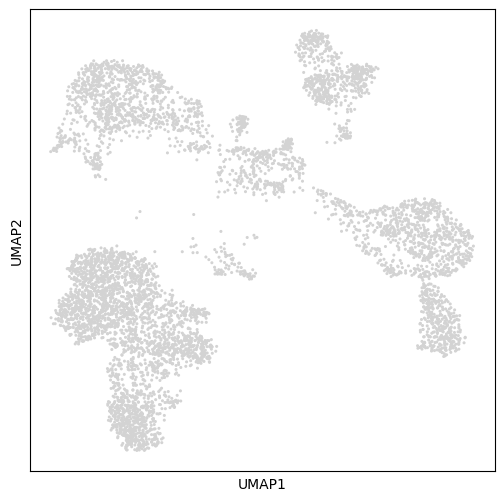

In [42]:
# plot the UMAP without any labels
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (100)}):
    sc.pl.umap(adata, legend_fontsize=8)

In [20]:
adata.uns["annotation_for_visualization_colors"] = ['#1f77b4', "#BEBEBE"]

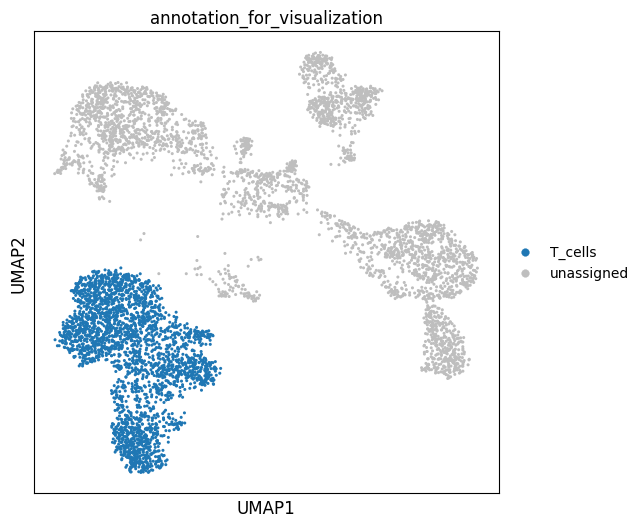

In [28]:
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (100)}):
    sc.pl.umap(adata, color="annotation_for_visualization", save="_Tcells_annotated.pdf")

### marker genes for T-cell subtypes

- 'CD4+ T activated': ['CD4', 'IL7R', 'TRBC2', 'ITGB1']
- 'CD4+ T naive': ['CD4', 'IL7R', 'TRBC2', 'CCR7']
- 'CD8+ T': ['CD8A', 'CD8B', 'GZMB', 'GZMA', 'CCL5', 'GZMK', 'GZMH', 'GZMA']
- 'T activation': ['CD69', 'CD38'] # CD69 much better marker!
- 'T naive': ['LEF1', 'CCR7', 'TCF7']
- 'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1']
- 'NK': ['GNLY', 'NKG7', 'CD247', 'GRIK4', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A']

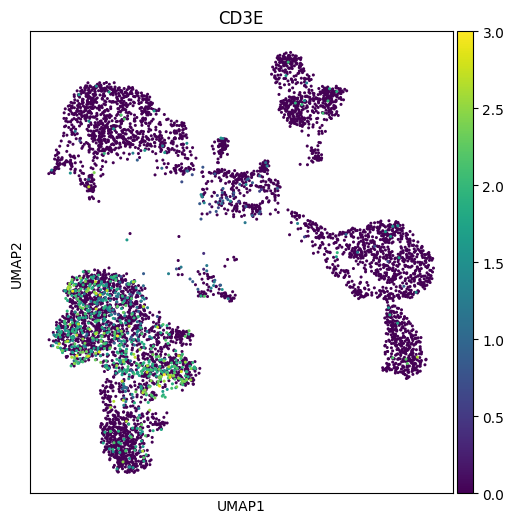

In [43]:
# marker for pan T-cell
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (100)}):
    sc.pl.umap(adata, color="CD3E", vmax=3)

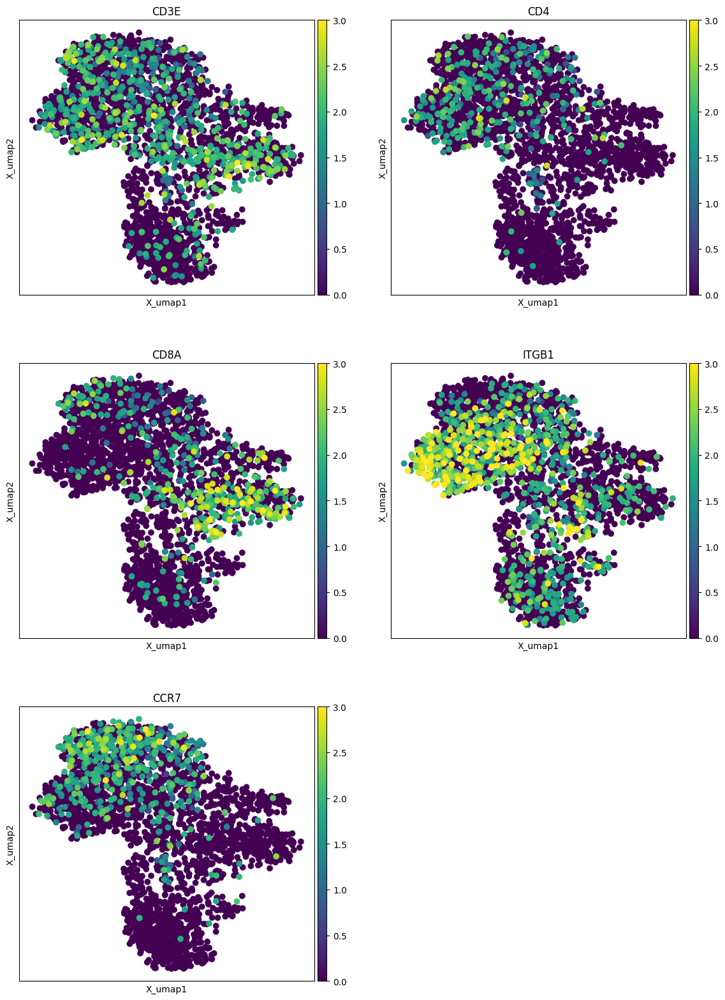

In [51]:
# dissection for the T-cell subtypes
# CD3E - T cells
# CD4 - CD4 T cells
# CD8A - CD8 T cells
# ITGB1 - activated T cells
# CCR7 - inactivated T cells
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs["annotation_for_visualization"]=="T_cells"], 
                basis="X_umap", 
                color=["CD3E","CD4","CD8A","ITGB1","CCR7"], 
                vmin=[0, 0, 0, 0, 0],
                vmax=[3, 3, 3, 3, 3],
                ncols=2, size=200)

In [46]:
120000/len(adata[adata.obs["annotation_for_visualization"]=="T_cells"])

43.24324324324324

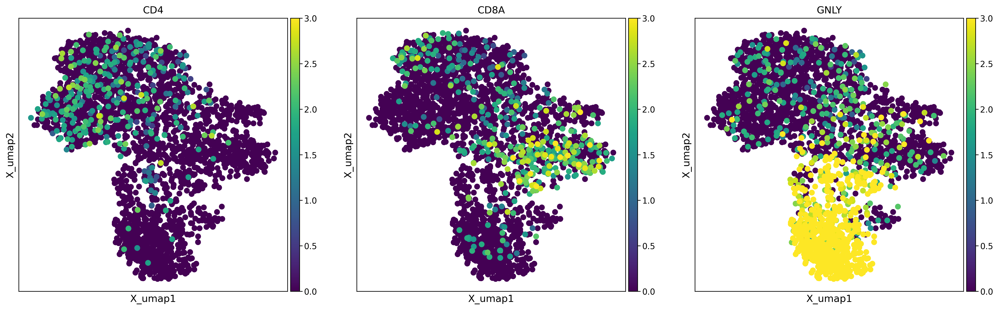

In [65]:
# dissection for the T-cell subtypes
# CD3E - T cells
# CD4 - CD4 T cells
# CD8A - CD8 T cells
# GNLY - NK cells
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.embedding(adata[adata.obs["annotation_for_visualization"]=="T_cells"], 
                basis="X_umap", 
                color=["CD4","CD8A","GNLY"], 
                vmin=[0, 0, 0],
                vmax=[3, 3, 3],
                ncols=3, size=200, save="Tcell_subtype_markers.pdf")

In [77]:
# color definition
adata.uns["manual_annotation_colors"] = {'CD4+T': '#1f77b4',
  'CD8+T': '#ff7f0e',
  'G_M_prog': '#2ca02c',
  'HSC': '#d62728',
  'Lymph_prog': '#9467bd',
  'MK_E_prog': '#8c564b',
  'NK': '#e377c2',
  'pDC': '#bcbd22',
  'unassigned': '#a9a9a9'}

In [78]:
adata.uns

OverloadedDict, wrapping:
	OrderedDict([('log1p', {'base': None}), ('manual_annotation_colors', {'CD4+T': '#1f77b4', 'CD8+T': '#ff7f0e', 'G_M_prog': '#2ca02c', 'HSC': '#d62728', 'Lymph_prog': '#9467bd', 'MK_E_prog': '#8c564b', 'NK': '#e377c2', 'pDC': '#bcbd22', 'unassigned': '#a9a9a9'})])
With overloaded keys:
	['neighbors'].

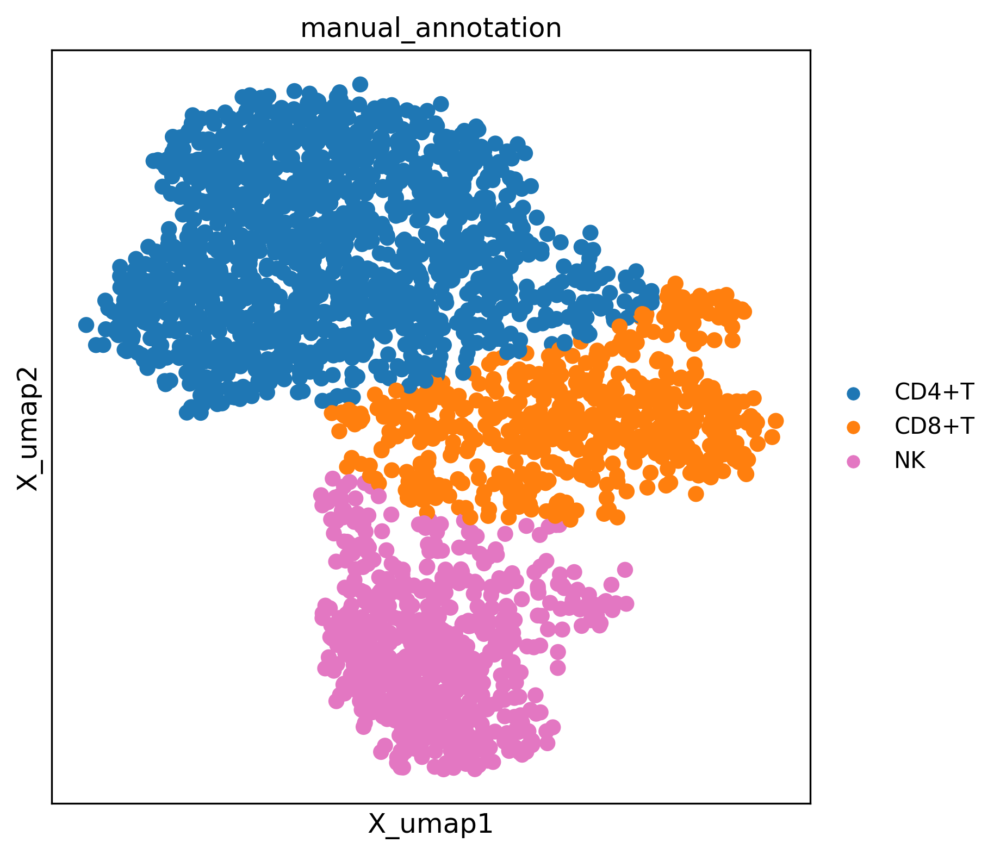

In [82]:
# dissection for the T-cell subtypes
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.embedding(adata[adata.obs["annotation_for_visualization"]=="T_cells"], 
                    basis="X_umap", 
                    color="manual_annotation", size=200, 
                    save="_Tcell_subtype_annotated.pdf")

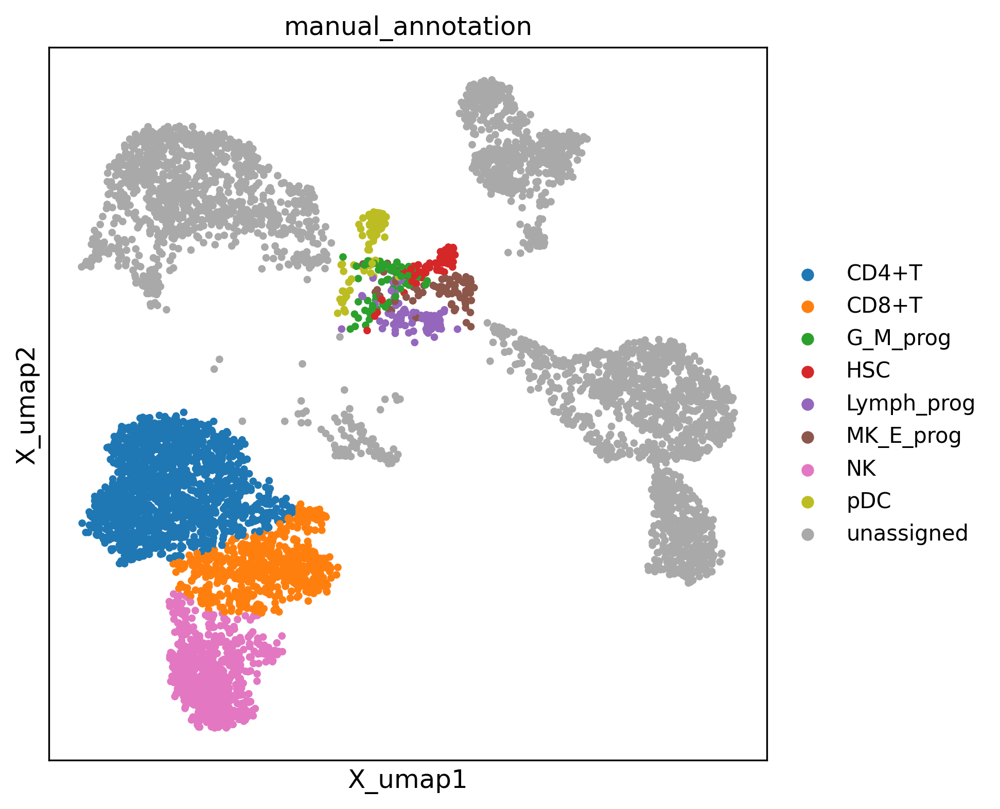

In [85]:
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.embedding(adata, 
                    basis="X_umap", 
                    color="manual_annotation", size=50, 
                    save="_fine_annotated.pdf")

## Checking the progenitor cluster at the center 
-> need sub-clustering for finer resolution in the UMAP embedding space

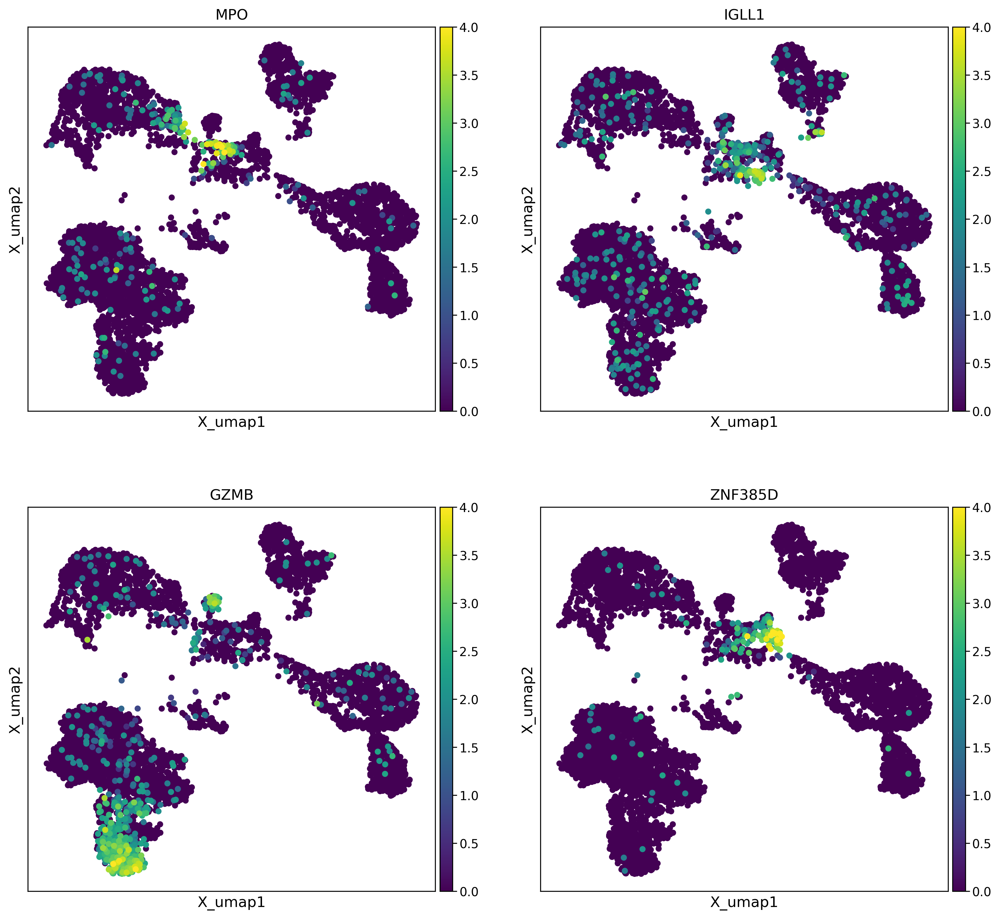

In [63]:
# Checking the progenitor population
# dissection for the T-cell subtypes
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata, 
                    basis="X_umap", 
                    color=["MPO","IGLL1","GZMB","ZNF385D"], 
                    vmin=[0, 0, 0, 0],
                    vmax=[4, 4, 4, 4],
                    ncols=2, size=100,
                    save="_progenitor_subtype_markers.pdf")

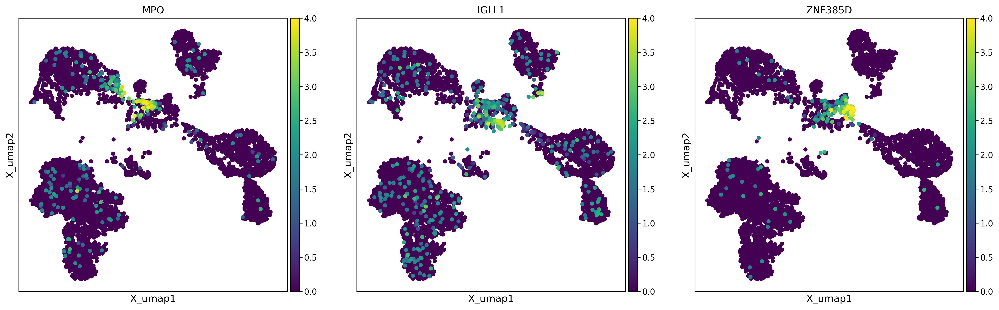

In [62]:
# Checking the progenitor population
# dissection for the T-cell subtypes
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata, 
                    basis="X_umap", 
                    color=["MPO","IGLL1","ZNF385D"], 
                    vmin=[0, 0, 0],
                    vmax=[4, 4, 4],
                    ncols=3, size=100)

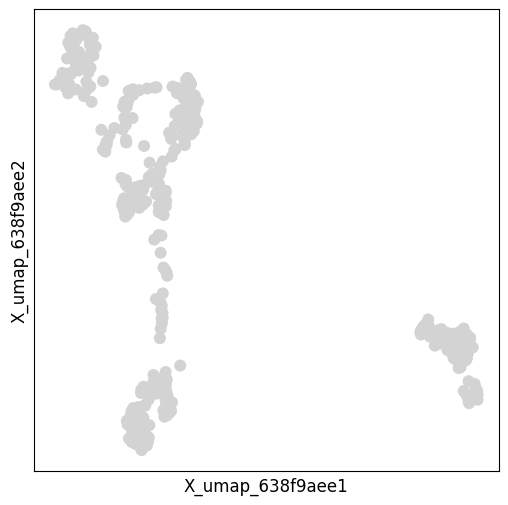

In [29]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (100)}):
    sc.pl.embedding(adata_prog, 
                    basis="X_umap_638f9aee",
                    save="_subclustering_progenitors_unannotated.pdf")

In [73]:
adata_prog.obs["cells"] = "progenitors"
adata_prog

AnnData object with n_obs × n_vars = 404 × 17739
    obs: 'name_0', 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'leiden_final', 'atac_ann', 'cell_type', 'pseudotime_order_GEX', 'manual_annotation', 'cells'
    var: 'name_0', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'mean', 'variance'
    uns: 'N_umap_638f9aee_params'
    obsm: 'X_latent_pca', 'X_umap_638f9aee'
    layers: 'X', 'counts'
    obsp: 'N_umap_638f9aee'

In [75]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata_prog, 
                basis="X_umap_638f9aee", 
                color=["cells","MPO","IGLL1","GZMB","ZNF385D","NRIP1"], 
                vmin=[0,0, 0, 0, 0, 0],
                vmax=[0,4, 4, 4, 4, 4],
                ncols=3)

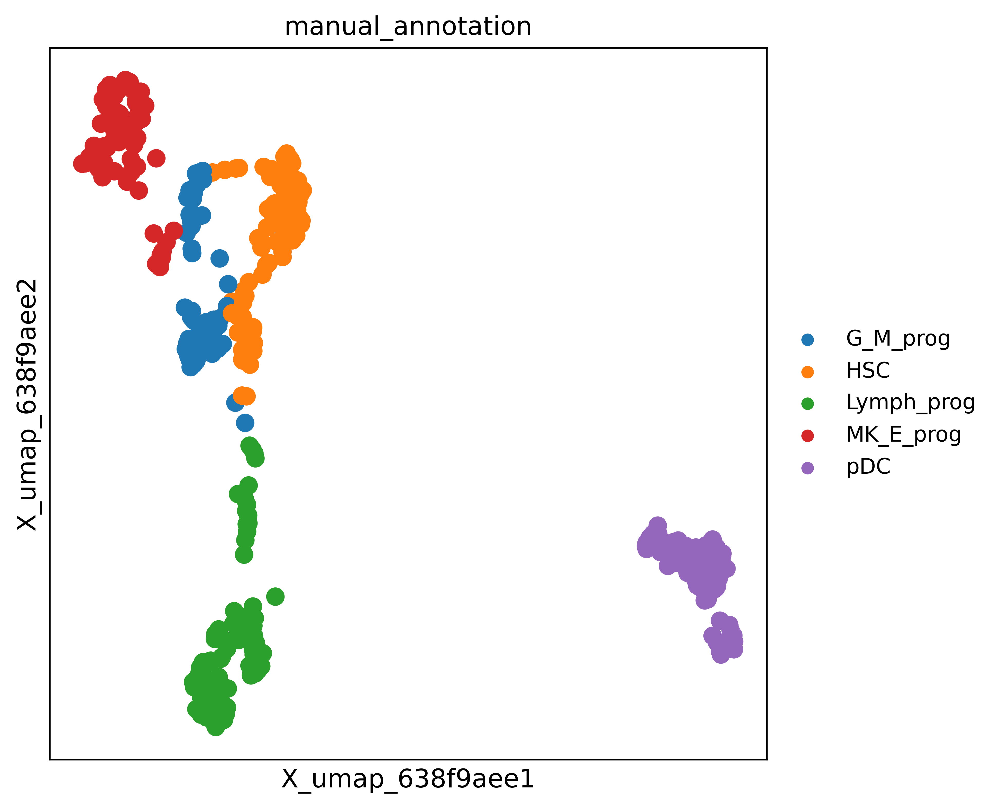

In [76]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata_prog, 
                basis="X_umap_638f9aee", 
                color=["manual_annotation"])

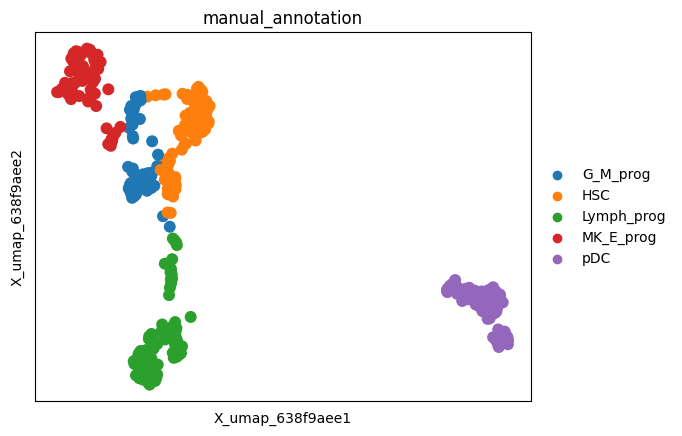

In [126]:
sc.pl.embedding(adata_test, basis="X_umap_638f9aee", color="manual_annotation")

## leiden clustering result

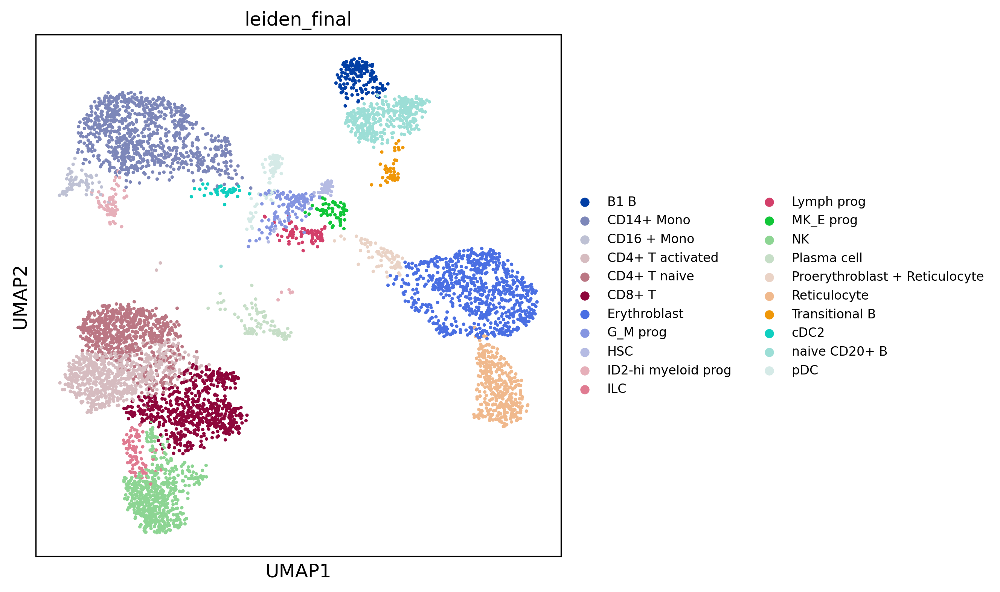

In [7]:
# plot the UMAP with the leiden clustering done by the neurips annotator group
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.umap(adata, color="leiden_final", legend_fontsize=8)

In [11]:
sc.pp.neighbors(adata)

In [12]:
sc.tl.leiden(adata, resolution=0.5, key_added="leiden_05")
sc.tl.leiden(adata, resolution=0.1, key_added="leiden_01")
sc.tl.leiden(adata, resolution=0.05, key_added="leiden_005")

<Figure size 3285x900 with 0 Axes>

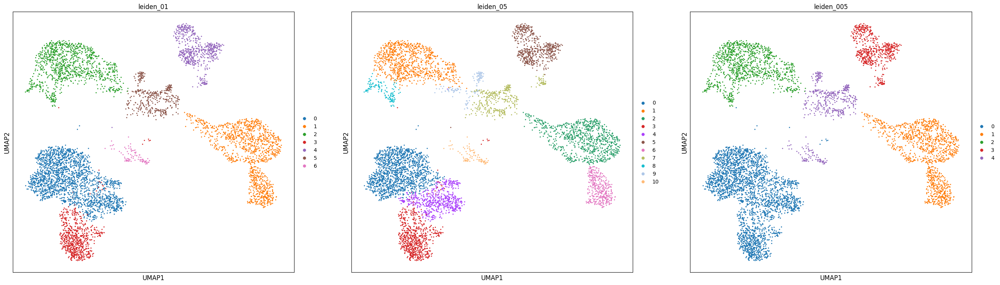

In [13]:
sc.pl.umap(adata, color=["leiden_01","leiden_05","leiden_005"], ncols=3)

In [ ]:
# plot the UMAP with the leiden clustering result
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.umap(adata, color="leiden_final", legend_fontsize=8)